# PyTorch Lesson 3: Multilayer Preceptron (MLP)

In [1]:
import torch
from torch import nn
import math

class bcols:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKCYAN = '\033[96m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

torch.__version__

'1.12.1+cu102'

In [2]:
def print_optim_stats(i, loss):
    print(f"- i = {bcols.OKBLUE}{i}{bcols.ENDC}, loss = {bcols.UNDERLINE}{loss.item():1.2e}{bcols.ENDC}")

# train a model w.r.t. the MSE loss
def train(x, y, model, lr, niter = 100):
    optim = torch.optim.SGD(model.parameters(), lr=lr)

    loss_record = np.zeros(niter)
    n, _ = x.shape
    for i in range(niter):
        optim.zero_grad()               # zeros out model.parameters()'s grads
        loss = sum((y - model(x))**2)/n 
        loss_record[i] = loss.item()    # record the loss
        loss.backward()                 # updates model.parameters()'s grads
        optim.step()                    # updates model.parameters()
        if i % round(niter / 5) == 0: 
            print_optim_stats(i, loss)            

    print_optim_stats(i, loss)
    return loss_record

# print model parameters or their shapes
def print_params(model, shape = False):
    for param in model.parameters():
        if shape:
            print(param.shape)
        else:
            print(param)

## Defining a dense layer

In [3]:
class Dense(nn.Module):
    def __init__(self, in_dim, out_dim = None, W = None, b = None):
        super().__init__()

        if out_dim is None:
            out_dim = 1

        self.layer = nn.Sequential(
            nn.Linear(in_features = in_dim, out_features = out_dim),
            nn.ReLU()
        )

        if W is not None:
            # self.layer[0].weight.data = W
            self.layer[0].weight = nn.Parameter(W)

        if b is not None:
            self.layer[0].bias = nn.Parameter(b)

    def forward(self,x):
        return self.layer(x)


model = Dense(2,4)
print(model)
print_params(model)

Dense(
  (layer): Sequential(
    (0): Linear(in_features=2, out_features=4, bias=True)
    (1): ReLU()
  )
)
Parameter containing:
tensor([[-0.1091, -0.0438],
        [-0.1063, -0.3455],
        [ 0.1439,  0.2128],
        [ 0.6121,  0.2589]], requires_grad=True)
Parameter containing:
tensor([-0.6492, -0.2814,  0.0310,  0.6397], requires_grad=True)


In [4]:
type(model.layer[0].weight)

torch.nn.parameter.Parameter

In [5]:
W = torch.tensor([[1.,1],[-1,-1],[-1,1],[1,-1]])
b = torch.tensor([-1.,-1,-1,-1])
hlayer = Dense(2,4,W,b)
print_params(hlayer)

Parameter containing:
tensor([[ 1.,  1.],
        [-1., -1.],
        [-1.,  1.],
        [ 1., -1.]], requires_grad=True)
Parameter containing:
tensor([-1., -1., -1., -1.], requires_grad=True)


In [6]:
hlayer(torch.tensor([-1.,1]))

tensor([0., 0., 1., 0.], grad_fn=<ReluBackward0>)

In [7]:
olayer = Dense(4, 1 , torch.ones(1,4), torch.tensor([0.])) 
# olayer = Dense(4, 1 , torch.tensor([[.5,.3,1,1]]), torch.tensor([0.])) 
# olayer = Dense(4,1)
print_params(olayer, True)

torch.Size([1, 4])
torch.Size([1])


In [8]:
model = nn.Sequential(hlayer, olayer)
x = torch.randn(10,2)
model(x)

tensor([[1.4834],
        [0.0000],
        [0.4850],
        [0.0000],
        [1.2270],
        [1.5597],
        [1.1094],
        [0.0000],
        [3.9376],
        [0.0972]], grad_fn=<ReluBackward0>)

In [9]:
import numpy as np
import plotly.graph_objects as go

def plot_surf(model, range=[-1,1], npoints = 100, contours = False):
    x = y = np.linspace(*range, npoints)
    X, Y = np.meshgrid(x, y)
    xin = torch.tensor(np.array([np.ravel(X), np.ravel(Y)]), dtype=torch.float).t()
    zout = model(xin).detach().numpy().ravel()   

    Z = zout.reshape(X.shape)
    fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z)])
    if contours:
        fig.update_traces(contours_z=dict(
            show=True, usecolormap=True, highlightcolor="limegreen", project_z=True
            ))
    
    fig.update_layout(autosize=False, width=600, height=500,
                  margin=dict(l=65, r=50, b=65, t=65))
    fig.show()

plot_surf(model, [-3,3], 100, True)

## Approximating a quadratic function

In [10]:
class Quad(nn.Module):
    def forward(self, x):
        return torch.sum(x**2, dim=1)[:,None]
quad = Quad()
plot_surf(quad, [-1,1])

In [11]:
seed = np.random.randint(10**5)
print(hex(seed))
torch.manual_seed(seed)

model = nn.Sequential(Dense(2,4), nn.Linear(4,1))
plot_surf(model, [-2,2])

0x14e41


In [12]:
x = torch.randn(100,2)
y = quad(x)  # true function

- i = 0, loss = 6.12e+00
- i = 200, loss = 1.52e+00
- i = 400, loss = 1.48e+00
- i = 600, loss = 1.48e+00
- i = 800, loss = 1.48e+00
- i = 999, loss = 1.48e+00


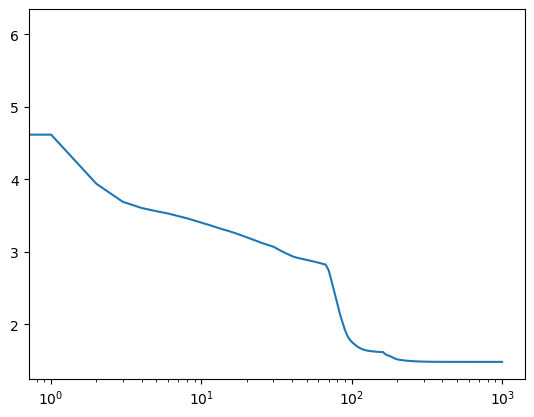

In [13]:
import matplotlib.pyplot as plt

loss_rec = train(x, y, model, 0.1, 1000)
plt.semilogx(loss_rec);

In [14]:
plot_surf(model,[-2,2])

In [15]:
seed = np.random.randint(10**5)
print(hex(seed))
torch.manual_seed(seed)
model1 = nn.Sequential(Dense(2,4), Dense(4,1))
model2 = nn.Sequential(Dense(2,4), Dense(4,4), Dense(4,1))
# model2 = nn.Sequential(Dense(2,4), Dense(4,4), nn.Linear(4,1))

0x12d52


In [16]:
torch.manual_seed(0x1867b)
model1 = nn.Sequential(Dense(2,4), nn.Linear(4,1))
model2 = nn.Sequential(Dense(2,4), Dense(4,4), nn.Linear(4,1))

In [17]:
plot_surf(model2)

In [18]:
niter = 1000
loss_rec1 = train(x, y, model1, 0.1, niter)
print("\n")
loss_rec2= train(x, y, model2, 0.1, niter)

- i = 0, loss = 8.31e+00
- i = 200, loss = 1.83e-01
- i = 400, loss = 1.58e-01
- i = 600, loss = 1.46e-01
- i = 800, loss = 1.26e-01
- i = 999, loss = 1.17e-01


- i = 0, loss = 9.88e+00
- i = 200, loss = 1.08e+00
- i = 400, loss = 1.07e+00
- i = 600, loss = 1.06e+00
- i = 800, loss = 1.06e+00
- i = 999, loss = 1.09e+00


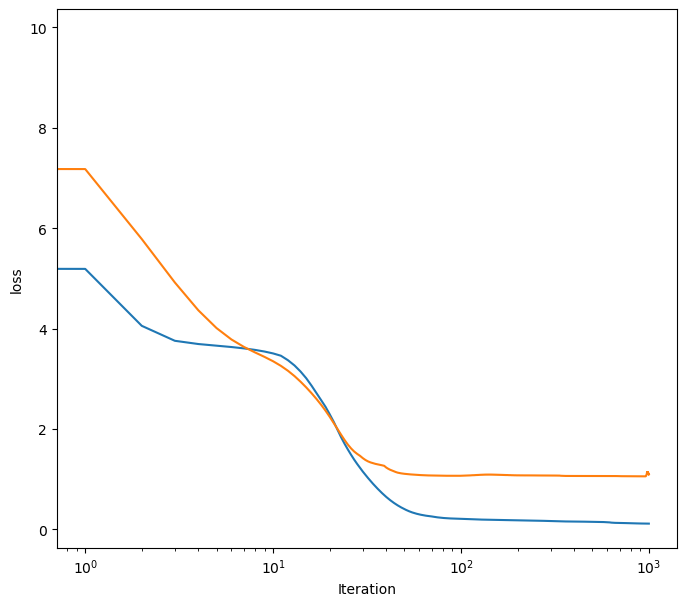

In [19]:
fig = plt.figure(figsize=(8,7))
plt.semilogx(loss_rec1);
plt.semilogx(loss_rec2);
plt.xlabel("Iteration")
plt.ylabel("loss")
# fig.tight_layout()
fig.savefig("loss_iter.png")

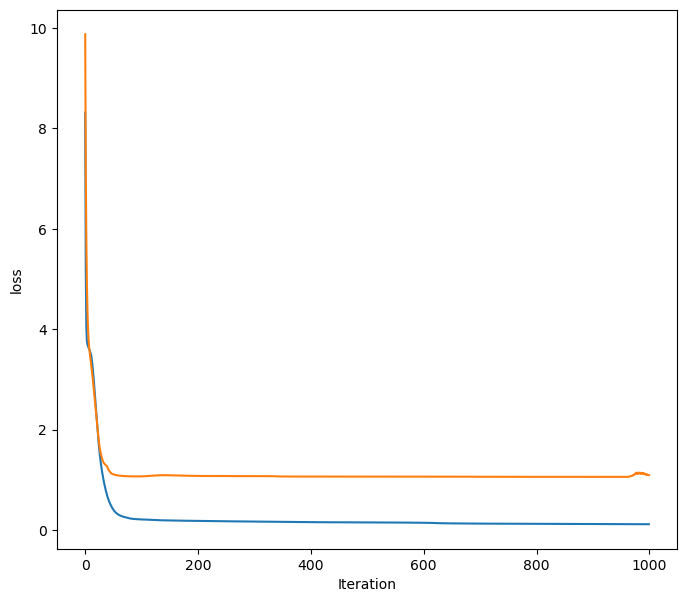

In [20]:
fig = plt.figure(figsize=(8,7))
plt.plot(loss_rec1);
plt.plot(loss_rec2);
plt.xlabel("Iteration")
plt.ylabel("loss")
fig.savefig("loss_iter2.png")

In [21]:
plot_surf(model2, range=[-2,2])

In [22]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_surf(*models, range=[-1,1], npoints = 100, contours = False):
    x = y = np.linspace(*range, npoints)
    X, Y = np.meshgrid(x, y)
    xin = torch.tensor(np.array([np.ravel(X), np.ravel(Y)]), dtype=torch.float).t()
    
    n_models = len(models)
    fig = make_subplots(rows=1, cols=n_models, specs = [[{'type': 'surface'}]*n_models])

    for j, model in enumerate(models):
      zout = model(xin).detach().numpy().ravel()   
      Z = zout.reshape(X.shape)
      fig.add_trace(
          go.Surface(x=X, y=Y, z=Z),
          row=1, col=j+1
      )
    if contours:
        fig.update_traces(contours_z=dict(
            show=True, usecolormap=True, highlightcolor="limegreen", project_z=True
            ))
    
    fig.update_layout(autosize=False, width=400*n_models, height=500,
                  margin=dict(l=65, r=50, b=65, t=65))
    fig.show()

In [26]:
# torch.manual_seed(84) # 84, 58613092, 0xe1cd, 0x8a2c. 0x18514, 0x1194 0x131e9 0xa77c 0x1301d
seed = np.random.randint(10**5)
# seed = 0x131e9
seed = 0xdd7d
print(hex(seed))
torch.manual_seed(seed)

h = 10
model1 = nn.Sequential(Dense(2,h), nn.Linear(h,1))
model2 = nn.Sequential(Dense(2,h), Dense(h,h), nn.Linear(h,1))
model3 = nn.Sequential(Dense(2,h), Dense(h,h), Dense(h,h), Dense(h,h), Dense(h,h), nn.Linear(h,1))

plot_surf(model1, model2, model3, range = [-2,2])

0xdd7d


- i = 0, loss = 7.33e+00
- i = 200, loss = 1.73e+00
- i = 400, loss = 8.67e-01
- i = 600, loss = 4.96e-01
- i = 800, loss = 3.48e-01
- i = 999, loss = 2.91e-01


- i = 0, loss = 7.52e+00
- i = 200, loss = 1.13e+00
- i = 400, loss = 1.87e-01
- i = 600, loss = 8.76e-02
- i = 800, loss = 6.07e-02
- i = 999, loss = 4.62e-02


- i = 0, loss = 7.97e+00
- i = 200, loss = 3.64e+00
- i = 400, loss = 3.23e+00
- i = 600, loss = 1.98e-01
- i = 800, loss = 6.96e-02
- i = 999, loss = 4.88e-02


Text(0, 0.5, 'loss')

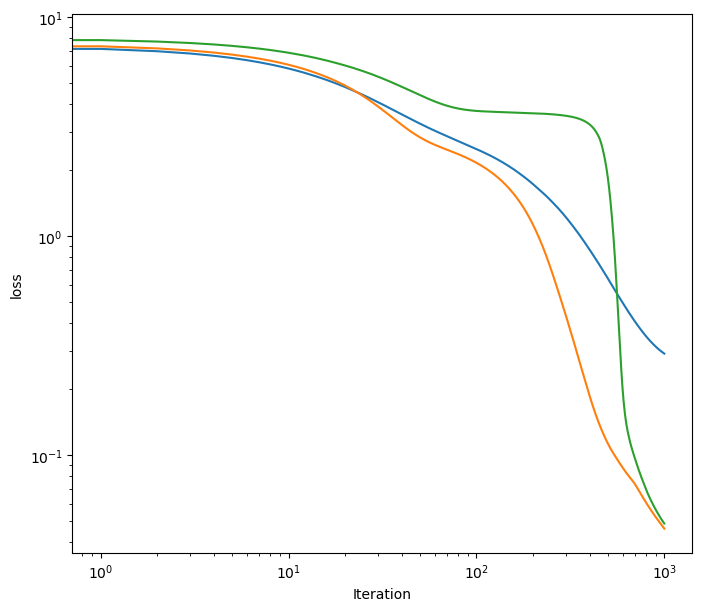

In [27]:
lr = .005
niter = 1000
loss_rec1 = train(x, y, model1, lr, niter)
print("\n")
loss_rec2= train(x, y, model2, lr, niter)
print("\n")
loss_rec3= train(x, y, model3, lr, niter)


fig = plt.figure(figsize=(8,7))
plt.loglog(loss_rec1);
plt.loglog(loss_rec2);
plt.loglog(loss_rec3);
plt.xlabel("Iteration")
plt.ylabel("loss")
# fig.tight_layout()

In [28]:
plot_surf(model1, model2, model3, range = [-2,2])